## Import Required Libraries

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import pyproj
import contextily as ctx
import seaborn as sns
import geoplot as gplt
import geoplot.crs as gcrs
import folium
import matplotlib.ticker as ticker
import scipy.stats
import webbrowser
from scipy.stats import shapiro
import statsmodels.api as sm
from scipy.stats import spearmanr
from scipy.stats import kendalltau
from sklearn.preprocessing import MinMaxScaler
import matplotlib
from IPython.display import display, HTML, Image
import json
from scipy import stats
%matplotlib inline
import dataframe_image as dfi
import mgwr
import libpysal as ps
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from mgwr.utils import compare_surfaces, truncate_colormap
from matplotlib.colors import LinearSegmentedColormap
from shapely.geometry import Point
import pysal
from pysal.model import spreg
import textwrap
import matplotlib.colors as colors#
import statistics

## Prepare the Datasets

In [2]:
# read in the Re-ordered Oxfordshire PPFI (V2) data
file_path = "C:/Users/medaamm/OneDrive - University of Leeds/PPFI (Project 1)/PPFI - Index Data/PPFI V2 Ox Reordered.xlsx"
ppfi_Ox_Reordered = pd.read_excel(file_path)

# read in the LSOA-Ward Lookup Table
file_path = "C:/Users/medaamm/OneDrive - University of Leeds/PPFI (Project 1)/Geographies Data/Lookup and Matching Geographies/LSOA 2011 to Ward 2016 Matching/LSOA (2011) to Ward (2016).xlsx"
LSOA2011_WD2016 = pd.read_excel(file_path)

# read in the Oxfordshire ward-level T2 Diabetes data
file_path = "C:/Users/medaamm/OneDrive - University of Leeds/PPFI (Project 1)/Storyline Data/Health Outcomes in the UK - Overview/Diabetes Prevalence/Cleaned - Diabetes Prevalence by Constituencies and Wards (2016-2017).xlsx"
T2Diabetes_Ox = pd.read_excel(file_path,sheet_name='Wards')
T2Diabetes_Ox['Estimated Diabetes Prevalence'] = pd.to_numeric(T2Diabetes_Ox['Estimated Diabetes Prevalence'])

# read in the JSON data to get the coordinates
file_path = "C:/Users/medaamm/OneDrive - University of Leeds/PPFI (Project 1)/Geographies Data/Oxfordshire Geographies Data/Oxfordshire LSOAs.json"
Ox_JSON = gpd.read_file(file_path)

# read in the Oxon Demographics Data (Household count, Population Density, RUC)
file_path = "C:/Users/medaamm/OneDrive - University of Leeds/PPFI (Project 1)/Storyline Data/Demographics Data - Oxfordshire/Oxon Demographics (RUC, Household, Pop Density).xlsx"
Ox_dem = pd.read_excel(file_path)

### Combine the PPFI with the Health Data by Matching Wards 2016 codes from the health data with the LSOAs 2011 codes from the PPFI data

In [3]:
temp = T2Diabetes_Ox[['WD16CD','Estimated Diabetes Prevalence']].merge(
LSOA2011_WD2016[['LSOA11CD','LSOA11NM','WD16NM','WD16CD']], on='WD16CD', how='inner')

In [4]:
ppfi_Ox_Reordered = ppfi_Ox_Reordered.merge(temp.loc[:, temp.columns != "LSOA11NM"], on='LSOA11CD', how='inner')

### Rename the JSON data columns appropriately

In [5]:
Ox_JSON = Ox_JSON.rename(
columns = {
    'geo_code':'LSOA11CD',
    'geo_label':'LSOA11NM'
}
)

### Drop the unwanted columns from the JSON data

In [6]:
Ox_JSON = Ox_JSON.drop(['geo_labelw','label','name'], axis=1)

### Merge the PPFI and JSON data

In [7]:
ppfi_Ox_Reordered = ppfi_Ox_Reordered.merge(Ox_JSON[['LSOA11CD','geometry']], on='LSOA11CD', how='inner')

### Convert the merged dataframe into a GeoPandas one

In [8]:
ppfi_Ox_Reordered = gpd.GeoDataFrame(ppfi_Ox_Reordered, geometry='geometry')

### Export the merged dataframe to an Excel file

In [9]:
ppfi_Ox_Reordered.to_excel('C:/Users/medaamm/OneDrive - University of Leeds/PPFI (Project 1)/Python Outputs/PPFI V2 Ox - T2 Diabetes.xlsx')

### Convert the geometry column to centroids in order to fit the GWR model

In [10]:
points = ppfi_Ox_Reordered.centroid

C:\Users\medaamm\AppData\Local\Temp\ipykernel_15644\4215279618.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  points = ppfi_Ox_Reordered.centroid


### Drop the unneeded column

In [11]:
ppfi_Ox_Reordered = ppfi_Ox_Reordered.drop('Unnamed: 0',axis=1)

## Fit a model with Type 2 Diabetes Prevalence as the DV and the PPFI dimensions as IVs

### Correct the data types of all columns to numeric

In [12]:
cols = ['Supermarket Proximity','Supermarket Accessibility','Non-Supermarket Proximity',
        'Fuel Poverty','Socio-demographic Barriers',
        'Food Support for Families','E-Commerce Access']
ppfi_Ox_Reordered['Estimated Diabetes Prevalence'] = ppfi_Ox_Reordered['Estimated Diabetes Prevalence'].apply(pd.to_numeric)
ppfi_Ox_Reordered[cols] = ppfi_Ox_Reordered[cols].apply(pd.to_numeric)

### Define the dependent and independent variables

In [13]:
# define the dependent variable as T2 Diabetes Prevalence
y = ppfi_Ox_Reordered['Estimated Diabetes Prevalence'].values.reshape(-1,1)

# define the independent variables as the dimensions of the PPFI
X = ppfi_Ox_Reordered[cols].values

### Define the coordinates of the LSOA centroids

In [14]:
u = points.x
v = points.y
coords = list(zip(u,v))

### Calibrate the model to select the optimal bandwidth

In [15]:
gwr_selector = Sel_BW(coords, y, X, kernel='bisquare')
gwr_bw = gwr_selector.search()
print(gwr_bw)

57.0


### Fit the model

In [16]:
gwr_model = GWR(coords, y, X, bw=gwr_bw, kernel='bisquare')

### Get the model results

In [17]:
gwr_results = gwr_model.fit()

### Get the global R-squared value

In [18]:
global_R2 = gwr_results.R2
print(global_R2)

0.9153199109875251


### Plot the local R2 at the LSOA level (Static Map)

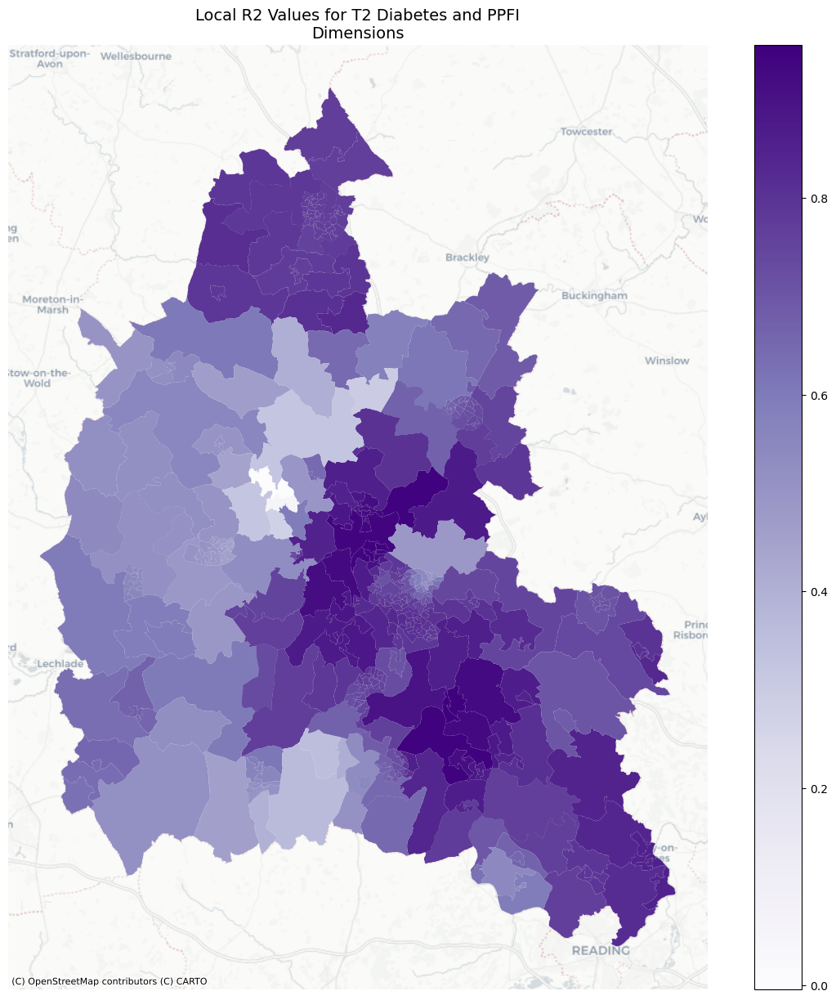

In [19]:
# plot the R2 values
ppfi_Ox_Reordered['R2'] = gwr_results.localR2

# define custom color map for R2
vmin = ppfi_Ox_Reordered['R2'].min()
vmax = ppfi_Ox_Reordered['R2'].max()
norm = matplotlib.colors.TwoSlopeNorm(vmin=vmin, vcenter = (vmin+vmax)/2, vmax=vmax)

fig,ax = plt.subplots(figsize=(15,15))
ppfi_Ox_Reordered.to_crs('EPSG:3857').plot(ax=ax, column='R2', legend=True, cmap='Purples', norm=norm)
plt.axis('off')
ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.Positron)
title = 'Local R2 Values for T2 Diabetes and PPFI Dimensions'
wrapped_title = '\n'.join(textwrap.wrap(title,45))
plt.title(wrapped_title, fontsize=14)
plt.show()

### Explore the coefficient estimates by creating a dataframe containing all the values

In [20]:
# Create a table for the Model coefficients and intercept values
model_parameters_T2Diabetes = pd.DataFrame(gwr_results.params, 
                               columns = ['Intercept','Supermarket Proximity', 
                                          'Supermarket Accessibility','Non-Supermarket Proximity',
                                          'Fuel Poverty','Socio-demographic Barriers',
                                          'Food Support for Families',
                                          'E-Commerce Access']
                               )

# add the geometry and LSOA columns to the model parameters dataframe
model_parameters_T2Diabetes = model_parameters_T2Diabetes.assign(LSOA11CD = ppfi_Ox_Reordered['LSOA11CD'])
model_parameters_T2Diabetes = model_parameters_T2Diabetes.assign(LSOA11NM = ppfi_Ox_Reordered['LSOA11NM'])
model_parameters_T2Diabetes = model_parameters_T2Diabetes.assign(geometry = ppfi_Ox_Reordered['geometry'])
model_parameters_T2Diabetes = model_parameters_T2Diabetes.assign(localR2 = ppfi_Ox_Reordered['R2'])
model_parameters_T2Diabetes = model_parameters_T2Diabetes.assign(District = ppfi_Ox_Reordered['District'])

### Create a summary of the model parameters for each of the five districts

In [21]:
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                 429
Number of covariates:                                                     8

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            182.488
Log-likelihood:                                                    -425.375
AIC:                                                                866.751
AICc:                                                               869.180
BIC:                                                              -2369.386
R2:                                                                   0.358
Adj. R2:                                                              0.347

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [22]:
Districts_modelParams = model_parameters_T2Diabetes[['Intercept', 'Supermarket Proximity', 'Supermarket Accessibility',
       'Non-Supermarket Proximity', 'Fuel Poverty',
       'Socio-demographic Barriers', 'Food Support for Families',
       'E-Commerce Access','District']].groupby('District').agg(['mean','median']).reset_index()
Districts_modelParams = Districts_modelParams.round(3)

Districts_modelParams.to_excel("C:/Users/medaamm/OneDrive - University of Leeds/Project 1 Final Paper/GWR with Type 2 Diabetes/Oxfordshire/GWR with T2D.xlsx",
                              sheet_name = "Model 2 District-Level Summary")

### Convert the created dataframe to a GeoPandas one for creating maps

In [23]:
model_parameters_T2Diabetes = gpd.GeoDataFrame(model_parameters_T2Diabetes, geometry='geometry')

### Creating maps for the estimated coefficients

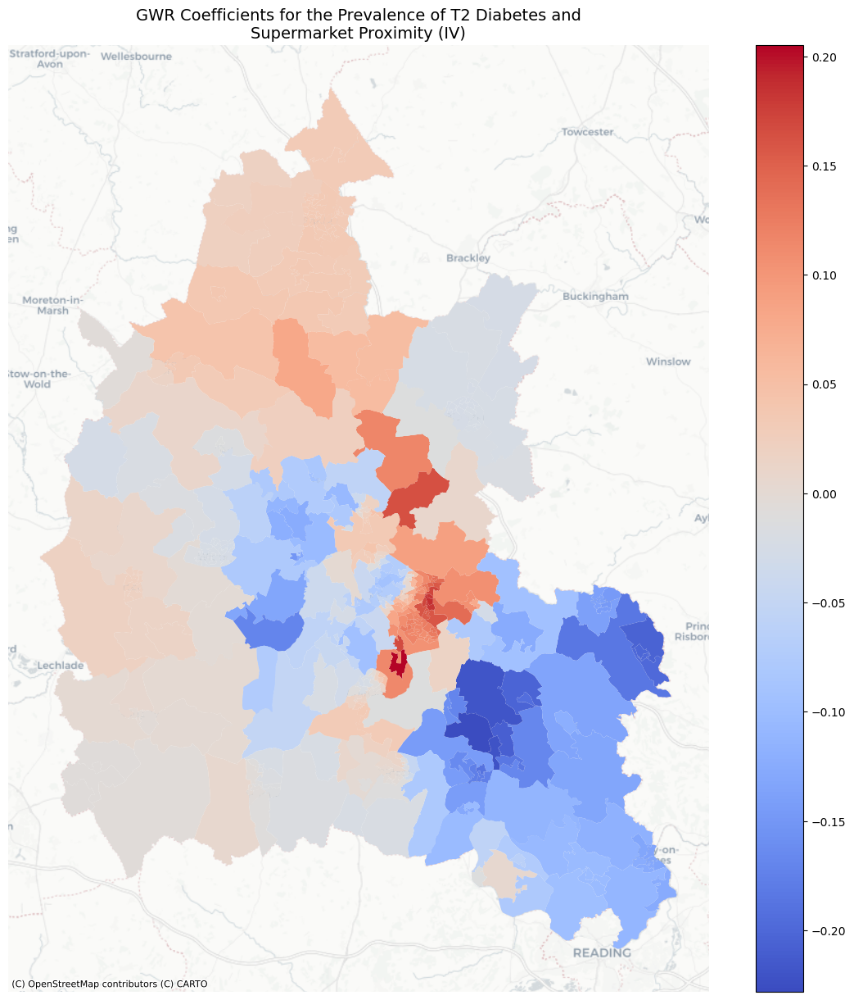

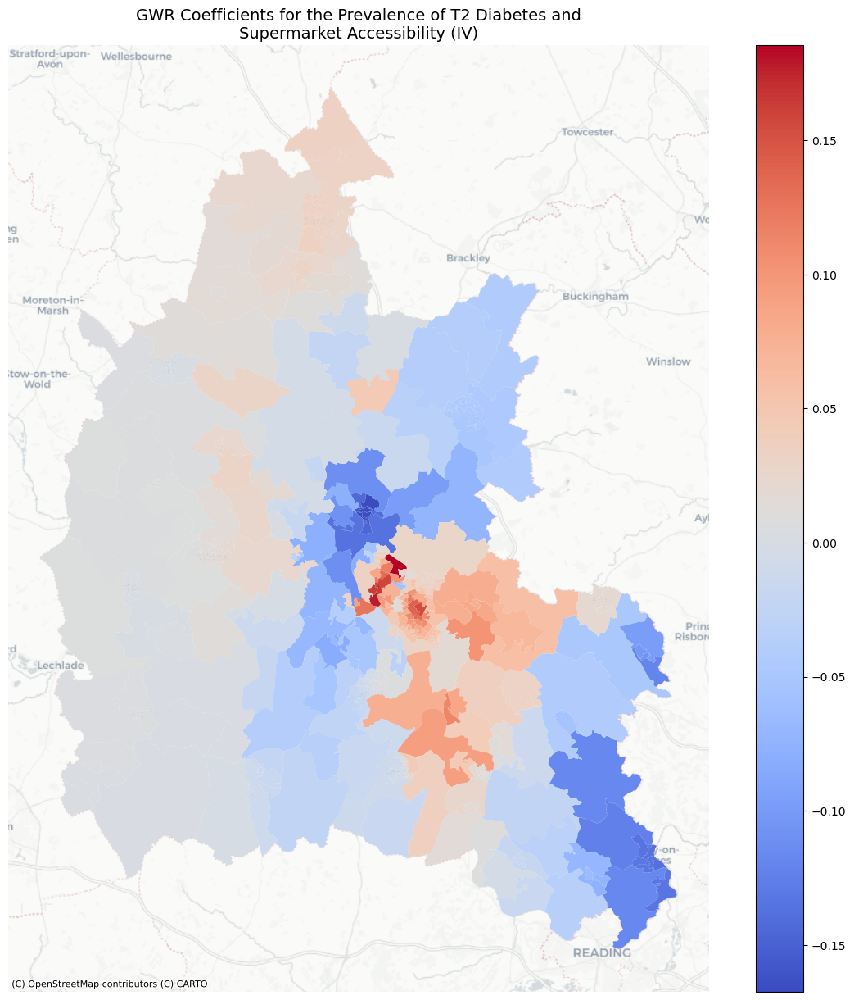

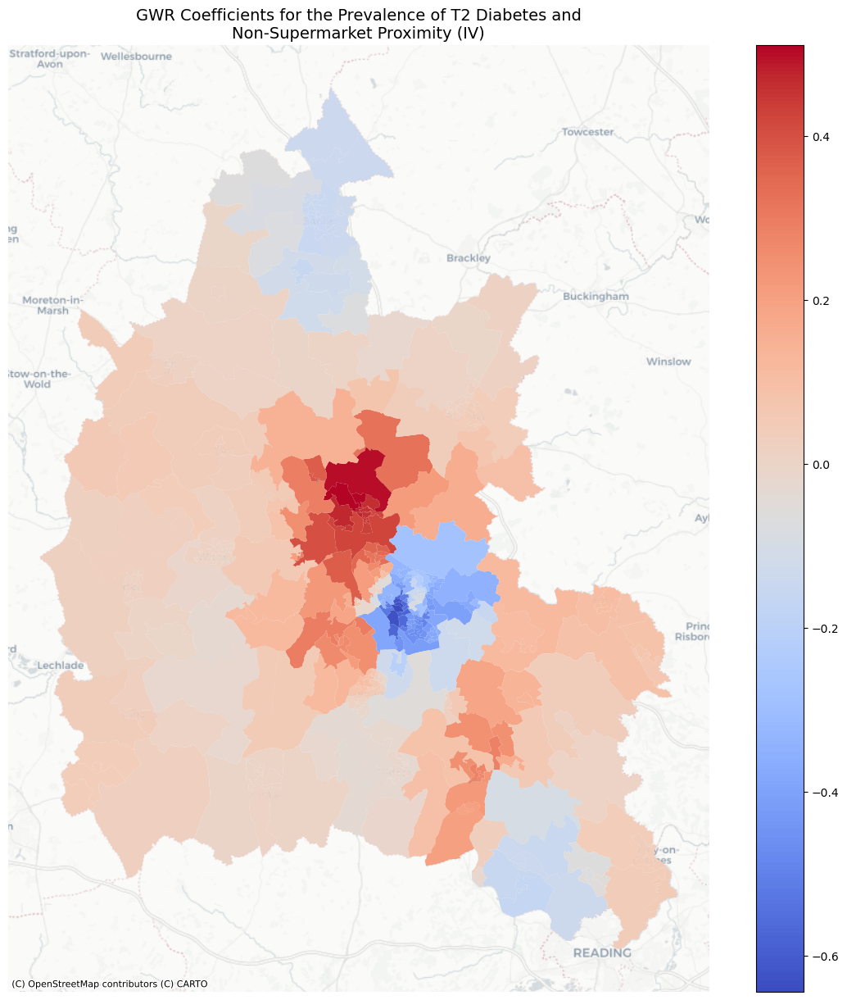

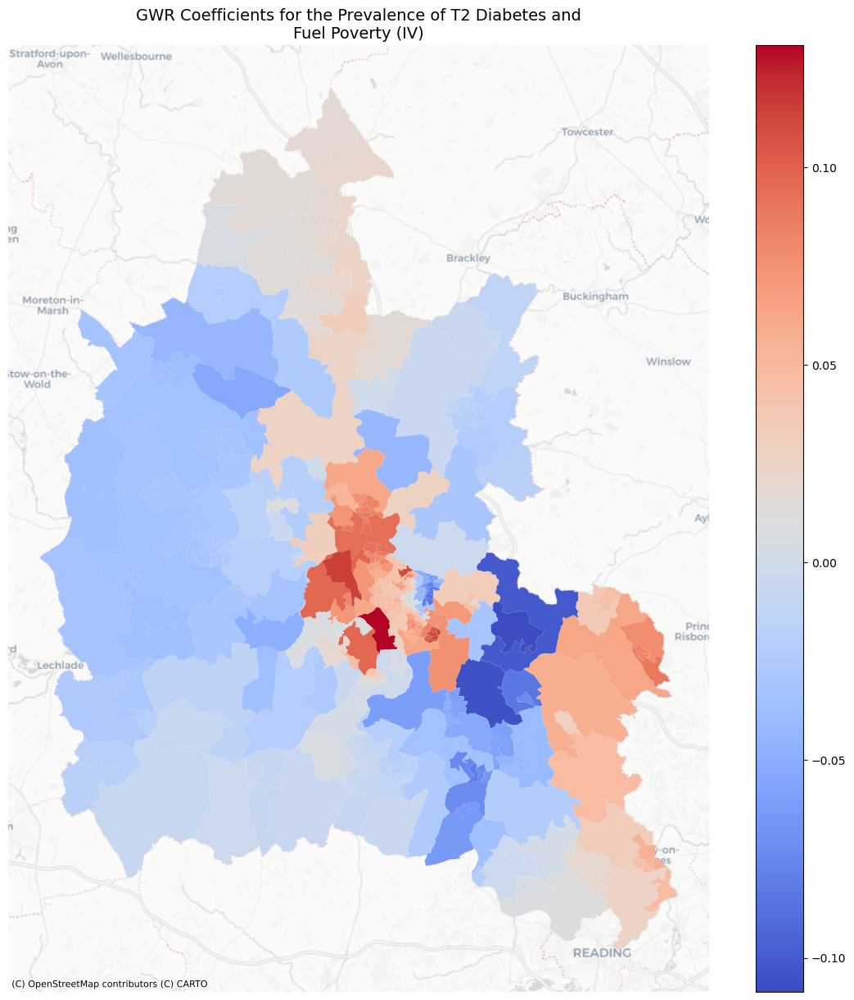

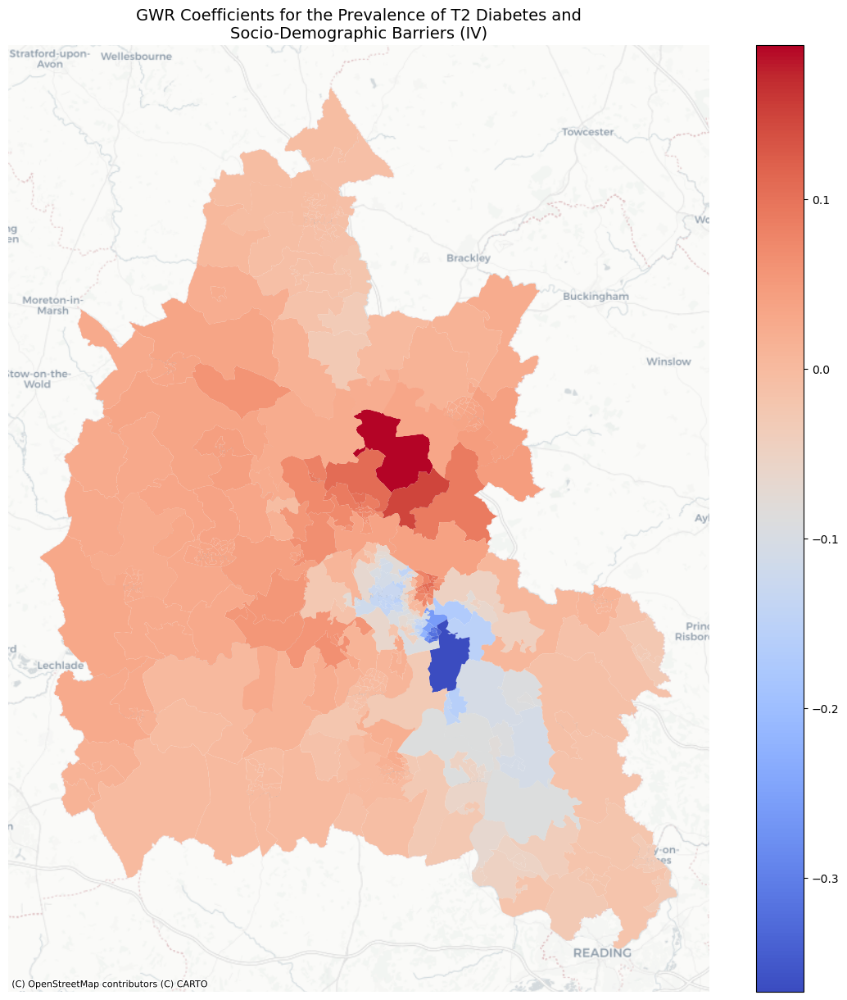

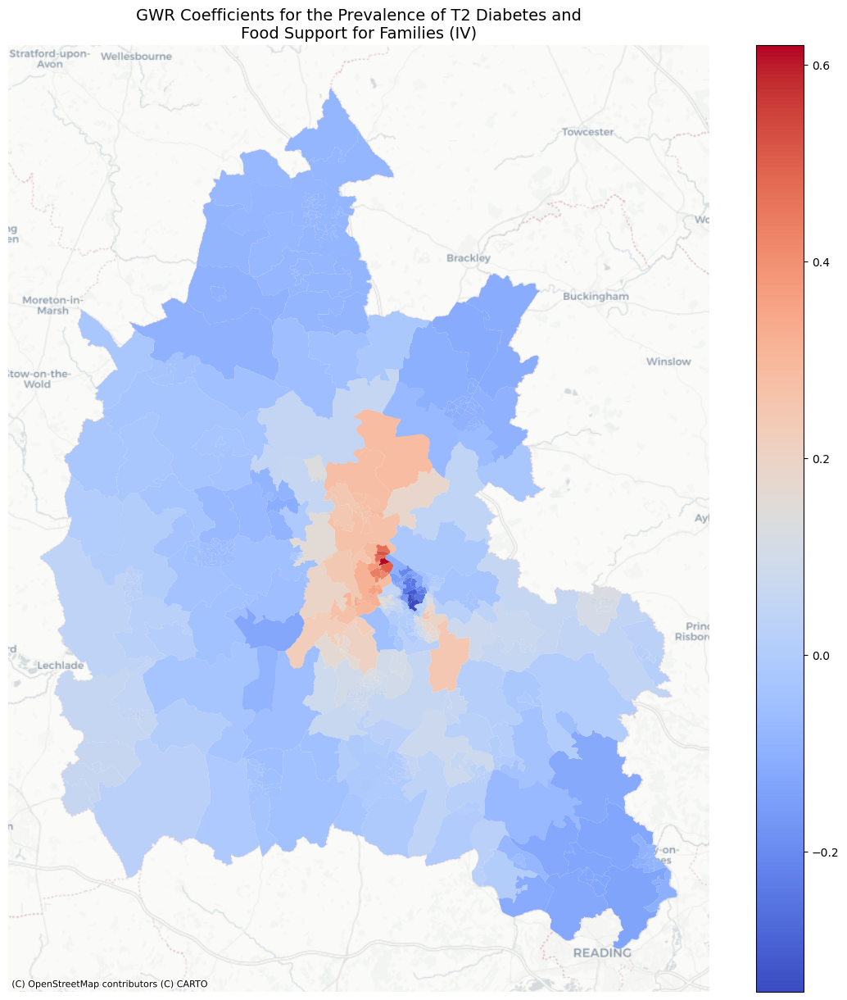

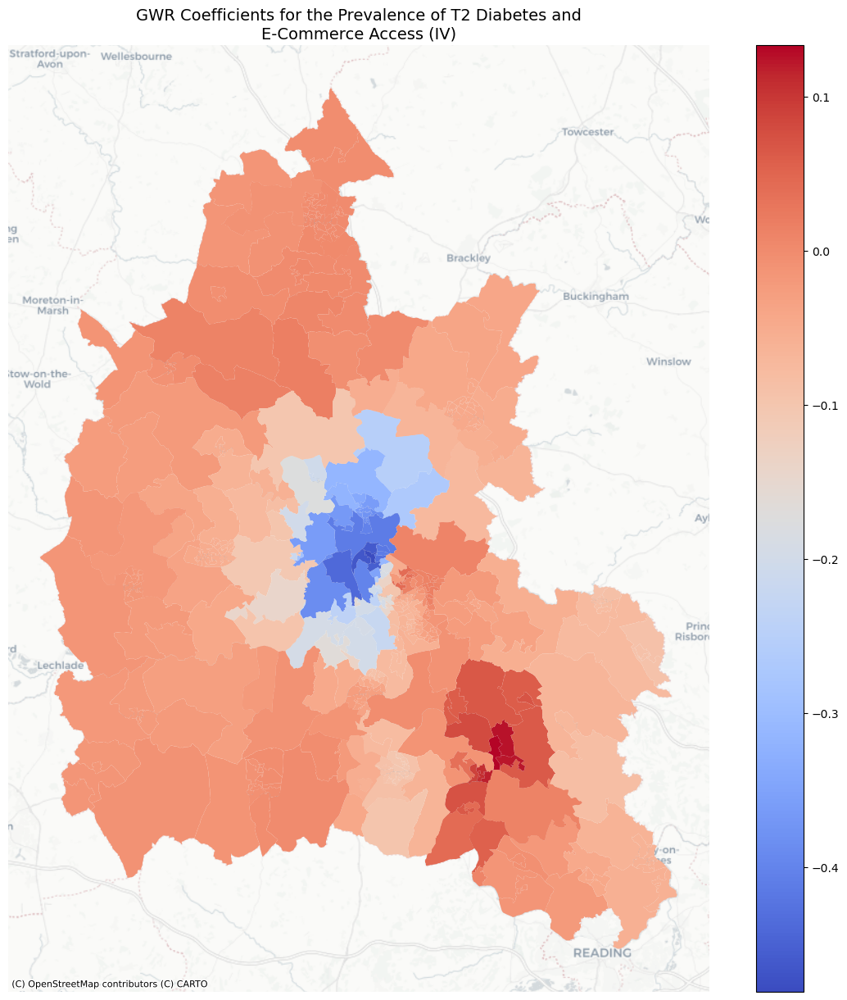

In [24]:
cols = ['Supermarket Proximity', 'Supermarket Accessibility','Non-Supermarket Proximity',
        'Fuel Poverty','Socio-demographic Barriers','Food Support for Families',
        'E-Commerce Access']
titles = ['Supermarket Proximity', 'Supermarket Accessibility', 'Non-Supermarket Proximity', 'Fuel Poverty',
         'Socio-Demographic Barriers','Food Support for Families', 'E-Commerce Access']

for i,col,title in zip(range(len(cols)),cols,titles):
    fig,ax = plt.subplots(figsize=(15,15))
    
    # define custom color map for the coefficients
    vmin = model_parameters_T2Diabetes[col].min()
    vmax = model_parameters_T2Diabetes[col].max()
    norm = matplotlib.colors.TwoSlopeNorm(vmin=vmin, vcenter = (vmin+vmax)/2, vmax=vmax)
    
    model_parameters_T2Diabetes.to_crs('EPSG:3857').plot(ax=ax, column=col, legend=True, cmap='coolwarm',
                                                        norm=norm)
    title = f"GWR Coefficients for the Prevalence of T2 Diabetes and {title} (IV)"
    wrapped_title = '\n'.join(textwrap.wrap(title,55))
    plt.title(wrapped_title, fontsize=14)
    ax.set_axis_off()
    ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.Positron)
    plt.show()

### Define a color map for the significant coefficient estimates

In [25]:
# define a color map with white at zero
vmin = -1
vmax = 1
norm = matplotlib.colors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)
cmap="RdBu_r"

## Explore Model Diagnostics

### Check the summary of the model results

In [26]:
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                 429
Number of covariates:                                                     8

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            182.488
Log-likelihood:                                                    -425.375
AIC:                                                                866.751
AICc:                                                               869.180
BIC:                                                              -2369.386
R2:                                                                   0.358
Adj. R2:                                                              0.347

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

### Generate a Statistical Summary of the Model Parameters

In [27]:
parameters_summary = pd.DataFrame()
col_names = ['Intercept', 'Supermarket Proximity','Supermarket Accessibility','Non-Supermarket Proximity',
            'Fuel Poverty','Socio-Demographic Barriers','Family Food Support','E-Commerce Access']
lst = ['Mean','STD','Min','Median','Max']
parameters_summary['Variable'] = col_names

mean_values = []
sd_values = []
min_values = []
median_values = []
max_values = []

gwr_results_df = pd.DataFrame(gwr_results.params)

for i in range(8):
    mean = gwr_results_df[i].mean()
    mean_values.append(round(mean,3))
    
    std = gwr_results_df[i].std()
    sd_values.append(round(std,3))
    
    minimum = gwr_results_df[i].min()
    min_values.append(round(minimum,3))
    
    maximum = gwr_results_df[i].max()
    max_values.append(round(maximum,3))
    
    median = gwr_results_df[i].median()
    median_values.append(round(median,3))

parameters_summary['Mean'] = mean_values
parameters_summary['STD'] = sd_values
parameters_summary['Min'] = min_values
parameters_summary['Median'] = median_values
parameters_summary['Max'] = max_values

### Export the statistical summary to an Excel file

In [28]:
with pd.ExcelWriter("C:/Users/medaamm/OneDrive - University of Leeds/Project 1 Final Paper/GWR with Type 2 Diabetes/Oxfordshire/GWR with T2D.xlsx",
                   engine="openpyxl", mode="a") as writer:
    parameters_summary.to_excel(writer, sheet_name = "Model 2 Parameters Summary")


### Define a formatting style for the plots to come

In [29]:
# define the style formatting
kwargs = {'edgecolor':'black',
         'linewidth':0.5
         }

### Visualizing the Statistical Significance of the Parameter Estimates

In [30]:
# default behaviour using corrected alpha
filter_tc = gwr_results.filter_tvals()

# without correction using common alpha
filter_t = gwr_results.filter_tvals(alpha=0.05)

# create a dataframe for the parameter estimates
parameter_estimates = pd.DataFrame()

# column names used to loop through and capture the model estimates
columns_significance = ['Supermarket Proximity','Supermarket Accessibility','Non-Supermarket Proximity',
                        'Fuel Poverty','Socio-demographic Barriers',
                        'Food Support for Families','E-Commerce Access']

# loop through to capture the parameter estimates
for col,i in list(zip(columns_significance, range(1,8))):
    parameter_estimates[col] = gwr_results.params[:,i]
    parameter_estimates[col+"_t"] = filter_t[:,i]
    parameter_estimates[col+"_tc"] = filter_tc[:,i]

# add other useful columns 
parameter_estimates[['LSOA11CD','LSOA11NM','geometry','District']] = ppfi_Ox_Reordered[['LSOA11CD','LSOA11NM','geometry','District']]

# convert the merged dataframe to a GeoPandas one
parameter_estimates = gpd.GeoDataFrame(parameter_estimates, geometry='geometry').to_crs('EPSG:3857')

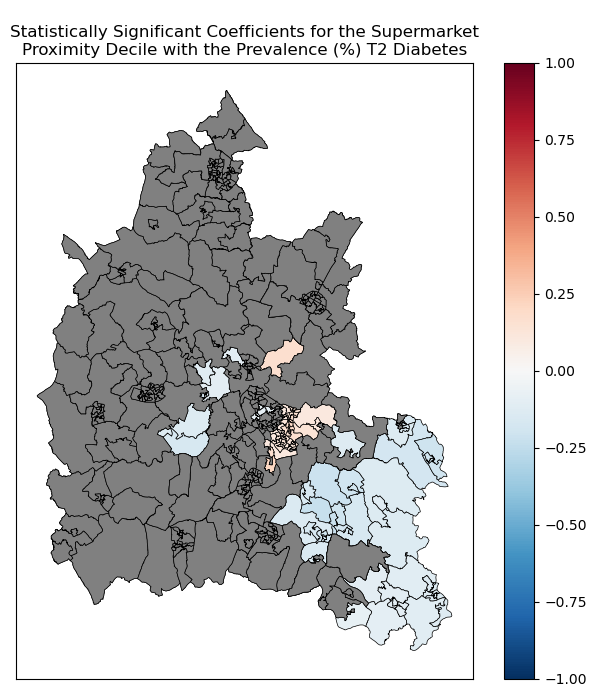

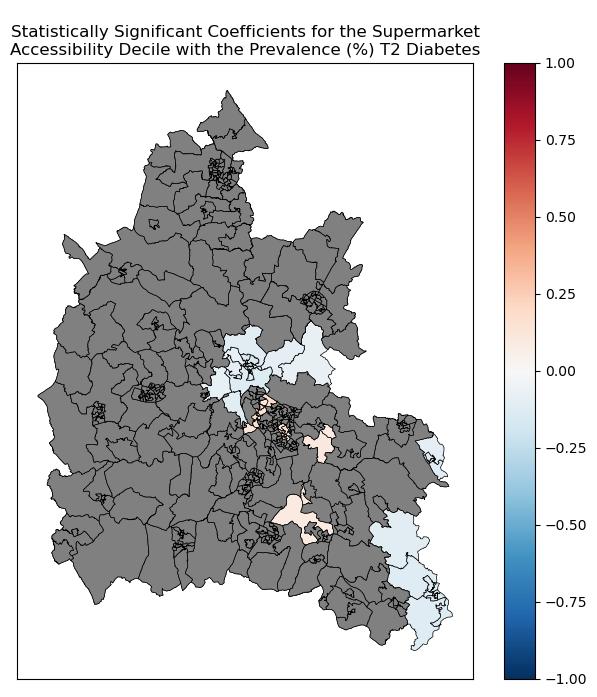

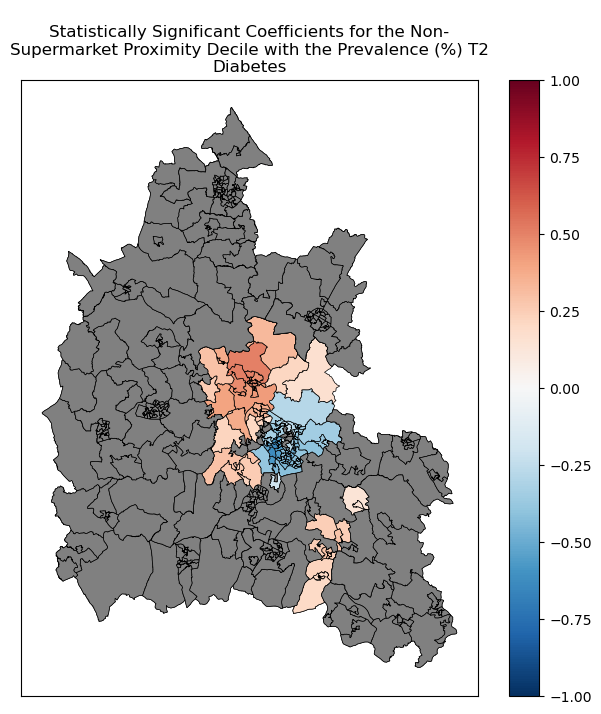

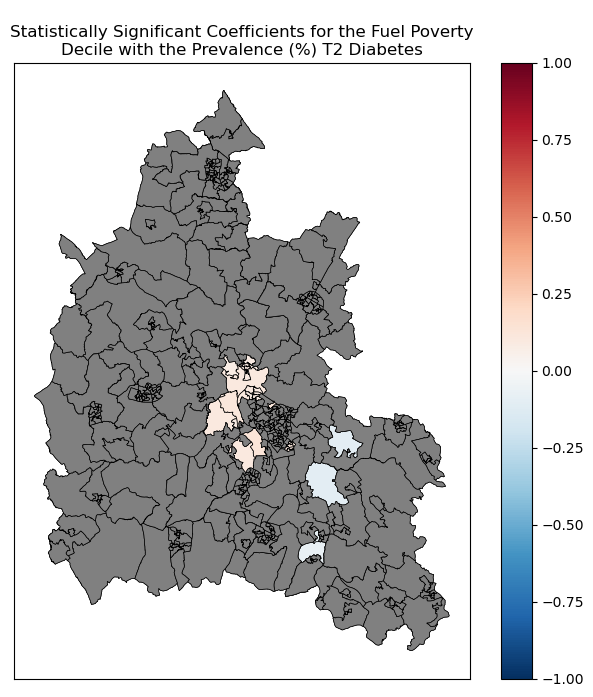

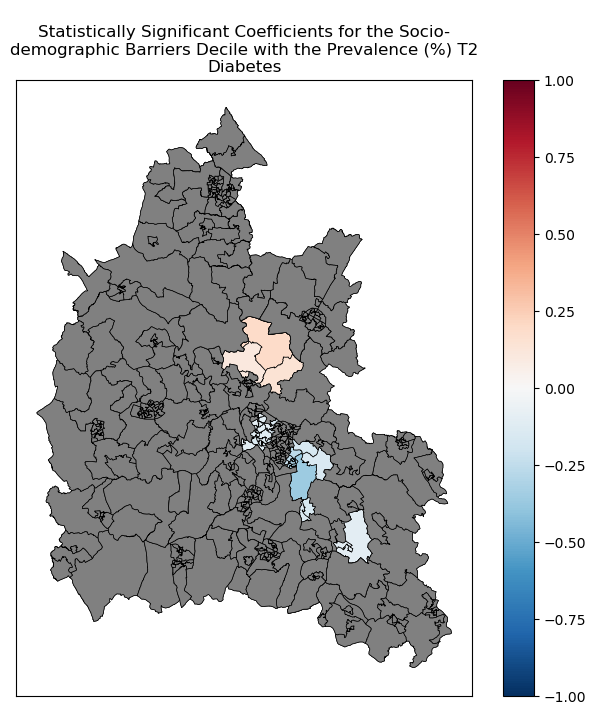

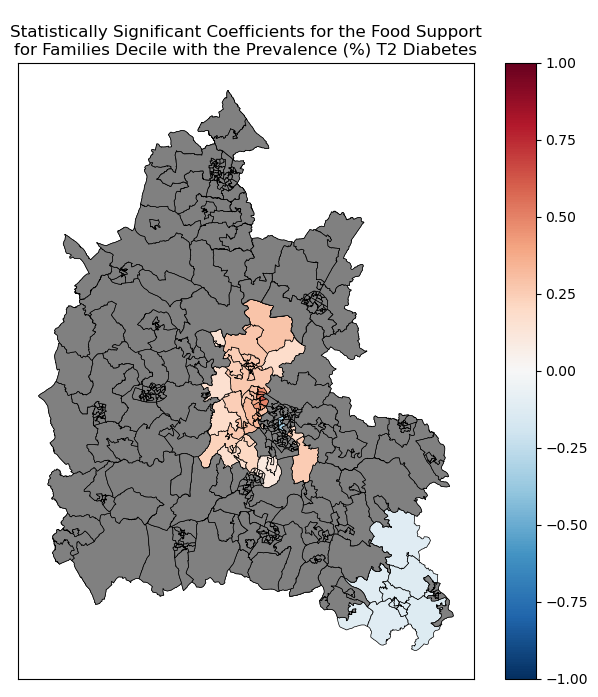

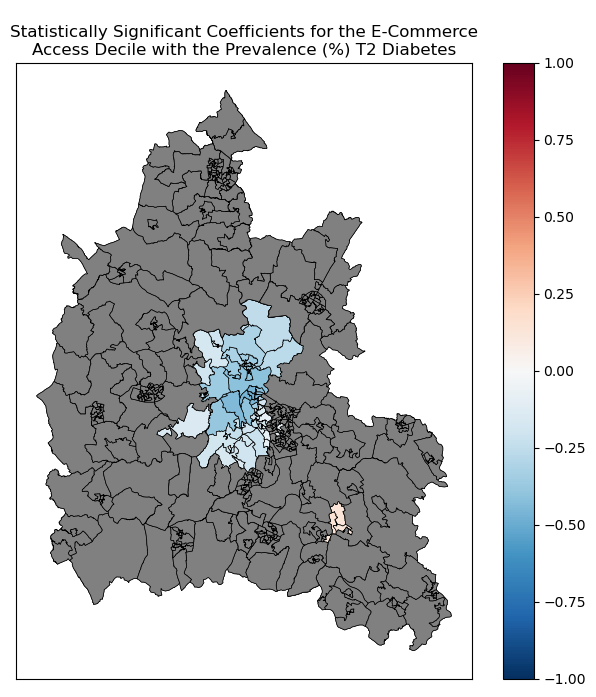

In [31]:
# define a list of column names used to generate the maps
columns_significance = ['Supermarket Proximity','Supermarket Accessibility','Non-Supermarket Proximity',
                        'Fuel Poverty','Socio-demographic Barriers',
                        'Food Support for Families','E-Commerce Access']

# define a list of dimension names to used to set titles for the maps
title_dimensions = ['Supermarket Proximity',
                   'Supermarket Accessibility',
                   'Non-Supermarket Proximity',
                   'Fuel Poverty',
                   'Socio-demographic Barriers',
                    'Food Support for Families',
                   'E-Commerce Access']

# create the maps
for col,title in list(zip(columns_significance,title_dimensions)):
    fig,ax = plt.subplots(figsize=(8,8))
    parameter_estimates.plot(
    col,
    ax=ax,
    legend=True,
    **kwargs,
    cmap=cmap,
    norm=norm
    )
    parameter_estimates[parameter_estimates[col+'_tc'] == 0].plot(ax=ax,
                                                                 color='grey',
                                                                 **kwargs)
    title = f"Statistically Significant Coefficients for the {title} Decile with the Prevalence (%) T2 Diabetes"
    ax.set_title("\n".join(textwrap.wrap(title,60)))                                                             
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

In [32]:
# define a list of dimensions names used to capture the parameter estimates
columns_significance = ['Supermarket Proximity','Supermarket Accessibility','Non-Supermarket Proximity',
                        'Fuel Poverty','Socio-demographic Barriers',
                        'Food Support for Families','E-Commerce Access']

# define a list of excel worksheet names for exporting later
sheet_names = ['SM_Prox','SM_Acc','NonSM_Prox','FuelPov','SD','FFF','E_Comm','Avg_Age']

# define a dictionnary showing the district names and the total LSOAs (2011) count of each to add that 
# to the district summaries
LSOAs_Count = {
    "Cherwell":102,
    "South Oxfordshire":93,
    "West Oxfordshire":68,
    "Vale of White Horse":81,
    "Oxford":85
}

# list of statistical measures
lst = ['Mean','Median','LSOA_Count','Minimum','Maximum']

# create the statistical summary
for col,sheet_name in zip(columns_significance, sheet_names):
    district_estimates = parameter_estimates[parameter_estimates[col+"_tc"] !=0].groupby('District').agg(
        LSOA_Count=('LSOA11CD','count'),
        Mean=(col,'mean'),
        Median = (col,'median'),
        Minimum = (col,'min'),
        Maximum = (col,'max'),
    ).reset_index()
    district_estimates['Total_LSOAs'] = district_estimates['District'].map(LSOAs_Count)
    district_estimates['LSOA_Coverage'] = round(district_estimates['LSOA_Count']/district_estimates['Total_LSOAs']*100,2)
    district_estimates[lst] = district_estimates[lst].round(3)
    with pd.ExcelWriter("C:/Users/medaamm/OneDrive - University of Leeds/Project 1 Final Paper/GWR with Type 2 Diabetes/Oxfordshire/GWR with T2D.xlsx",
                   engine="openpyxl", mode="a") as writer:
        district_estimates.to_excel(writer, sheet_name = f"Summary_{sheet_name}")

### Get the significant LSOAs list for each District and Dimension

In [33]:
for col,sheet_name in zip(columns_significance, sheet_names):
    Sig_LSOA_list = parameter_estimates[parameter_estimates[col+"_tc"] != 0].round(3)
    Sig_LSOA_list = Sig_LSOA_list[['LSOA11CD','District',col]].merge(Ox_dem[['LSOA11CD','LSOA21CD','LSOA21NM','RUC11']], 
                                                                 on='LSOA11CD',how='inner')
    with pd.ExcelWriter("C:/Users/medaamm/OneDrive - University of Leeds/Project 1 Final Paper/GWR with Type 2 Diabetes/Oxfordshire/GWR with T2D.xlsx",
                   engine="openpyxl", mode="a") as writer:
        Sig_LSOA_list.to_excel(writer, sheet_name = f"Sig_{sheet_name}")

### Group the district-level estimates of LSOAs by the RUC classification

In [34]:
# create a dictionnary of the Cherwell LSOAs count by RUC classification 
District_RUC_LSOA_Count = {
    "Cherwell":{
        "Urban city and town": 69,
        "Rural village and dispersed": 26,
        "Rural town and fringe": 7
    },
    "South Oxfordshire":{
        "Urban city and town": 49,
        "Rural village and dispersed": 21,
        "Rural town and fringe": 23
    },
    "West Oxfordshire":{
        "Urban city and town": 28,
        "Rural village and dispersed": 19,
        "Rural town and fringe": 21
    },
    "Oxford":{
        "Urban city and town": 84,
        "Rural village and dispersed": 0,
        "Rural town and fringe": 1
    },
    "Vale of White Horse":{
        "Urban city and town": 49,
        "Rural village and dispersed": 10,
        "Rural town and fringe": 22
    }
}


def get_value(row):
    return District_RUC_LSOA_Count[row["District"]][row['RUC11']]

for col,sheet_name in zip(columns_significance, sheet_names):
    Grouped_RUC = parameter_estimates[parameter_estimates[col+"_tc"] != 0]
    Grouped_RUC = Grouped_RUC[['LSOA11CD','District',col]].merge(Ox_dem[['LSOA11CD','RUC11']], on='LSOA11CD', how='inner')
    Grouped_RUC = Grouped_RUC.groupby(['District','RUC11']).agg(
        LSOA_Count = ('LSOA11CD','count'),
        Coeff_Average = (col,'mean')
    ).reset_index()
    Grouped_RUC['Total_LSOAs'] = Grouped_RUC.apply(get_value, axis=1)
    Grouped_RUC['LSOA_Coverage'] = round(Grouped_RUC['LSOA_Count']/Grouped_RUC['Total_LSOAs']*100,2)
    Grouped_RUC['Coeff_Average'] = round(Grouped_RUC['Coeff_Average'],3)
    with pd.ExcelWriter("C:/Users/medaamm/OneDrive - University of Leeds/Project 1 Final Paper/GWR with Type 2 Diabetes/Oxfordshire/GWR with T2D.xlsx",
                   engine="openpyxl", mode="a") as writer:
        Grouped_RUC.to_excel(writer, sheet_name = f"Sig_RUC_{sheet_name}")

## Fit a GWR Model with the Prevalence of T2 Diabetes as the DV and the PPFI combined decile as the IV

### Define the variables

In [35]:
# define the dependent variable as T2 Diabetes Prevalence
y = ppfi_Ox_Reordered['Estimated Diabetes Prevalence'].values.reshape(-1,1)

# define the independent variables as the dimensions of the PPFI
X = ppfi_Ox_Reordered[['PPFI Combined Decile']].values

y = np.array(y)
X = np.array(X)

### Define the coordinates

In [36]:
u = points.x
v = points.y
coords = list(zip(u,v))

### Calibrate the model and compute the optimal bandwidth

In [37]:
gwr_selector = Sel_BW(coords, y, X, kernel='bisquare')
gwr_bw = gwr_selector.search()
print(gwr_bw)

45.0


### Fit the model

In [38]:
gwr_model = GWR(coords, y, X, bw=gwr_bw, kernel='bisquare')

### Get the results

In [39]:
gwr_results = gwr_model.fit()

### Get the global R-squared value

In [40]:
global_R2 = gwr_results.R2
print(global_R2)

0.7871322023981675


## Model Diagnostics

### View a statistical summary of the model results

In [41]:
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                 429
Number of covariates:                                                     2

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            277.741
Log-likelihood:                                                    -515.467
AIC:                                                               1034.934
AICc:                                                              1036.990
BIC:                                                              -2310.501
R2:                                                                   0.022
Adj. R2:                                                              0.020

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

### Create a statistical summary of the model parameters

In [42]:
parameters_summary = pd.DataFrame()
col_names = ['Intercept', 'Combined Decile']
lst = ['Mean','STD','Min','Median','Max']
parameters_summary['Variable'] = col_names

mean_values = []
sd_values = []
min_values = []
median_values = []
max_values = []

gwr_results_df = pd.DataFrame(gwr_results.params)

for i in range(2):
    mean = gwr_results_df[i].mean()
    mean_values.append(round(mean,3))
    
    std = gwr_results_df[i].std()
    sd_values.append(round(std,3))
    
    minimum = gwr_results_df[i].min()
    min_values.append(round(minimum,3))
    
    maximum = gwr_results_df[i].max()
    max_values.append(round(maximum,3))
    
    median = gwr_results_df[i].median()
    median_values.append(round(median,3))

parameters_summary['Mean'] = mean_values
parameters_summary['STD'] = sd_values
parameters_summary['Min'] = min_values
parameters_summary['Median'] = median_values
parameters_summary['Max'] = max_values

### Export the statistical Summary to an Excel file

In [43]:
with pd.ExcelWriter("C:/Users/medaamm/OneDrive - University of Leeds/Project 1 Final Paper/GWR with Type 2 Diabetes/Oxfordshire/GWR with T2D.xlsx",
                   engine="openpyxl", mode="a") as writer:
    parameters_summary.to_excel(writer, sheet_name = "Model 1 Parameters Summary")

### Visualize the Statistical Significance of Parameter Estimates

In [44]:
# default behaviour using corrected alpha
filter_tc = gwr_results.filter_tvals()

# without correction using common alpha
filter_t = gwr_results.filter_tvals(alpha=0.05)

# create a dataframe for the parameter estimates
parameter_estimates = pd.DataFrame()

parameter_estimates['PPFI Combined Decile'] = gwr_results.params[:,1]
parameter_estimates['PPFI Combined Decile_t'] = filter_t[:,1]
parameter_estimates['PPFI Combined Decile_tc'] = filter_tc[:,1]

# add other useful columns 
parameter_estimates[['LSOA11CD','LSOA11NM','geometry','District']] = ppfi_Ox_Reordered[['LSOA11CD','LSOA11NM','geometry','District']]

# convert the merged dataframe to a GeoPandas one
parameter_estimates = gpd.GeoDataFrame(parameter_estimates, geometry='geometry').to_crs('EPSG:3857')

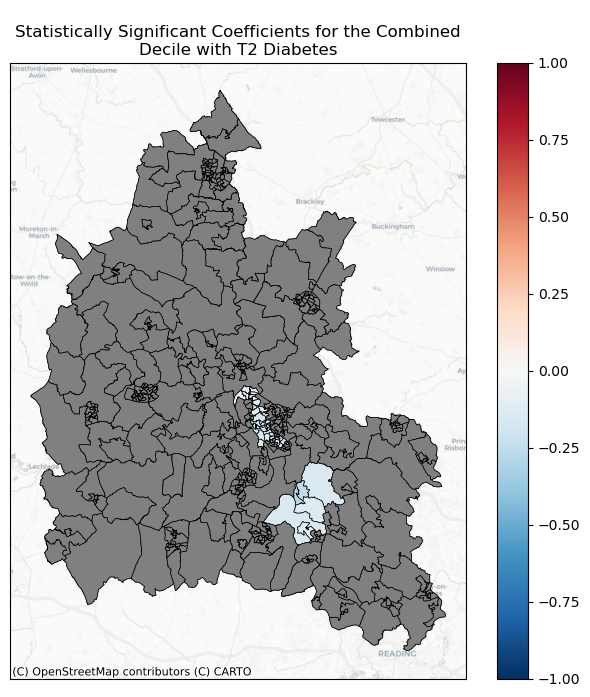

In [45]:
# generate the map of the statistically significant parameter estimates
fig,ax = plt.subplots(figsize=(8,8))

parameter_estimates.plot(
    'PPFI Combined Decile',
    ax=ax,
    legend=True,
    **kwargs,
    cmap=cmap,
    norm=norm
)

parameter_estimates[filter_tc[:,1] == 0].plot(ax=ax,
                                              color='grey',
                                            **kwargs
                                             )
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
title = f"Statistically Significant Coefficients for the Combined Decile with T2 Diabetes"
ax.set_title("\n".join(textwrap.wrap(title,60)))  
ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.Positron)

plt.show()

In [46]:
district_estimates = parameter_estimates[filter_tc[:,1] !=0].groupby('District').agg(LSOA_Count = ('LSOA11CD','count'),
                                            Mean = ('PPFI Combined Decile','mean'),
                                            Median = ('PPFI Combined Decile','median'),
                                            Minimum = ('PPFI Combined Decile','min'),
                                            Maximum = ('PPFI Combined Decile','max')).reset_index()
                                                               
lst = ['LSOA_Count','Mean','Median','Minimum','Maximum']
district_estimates[lst] = district_estimates[lst].round(3)
LSOAs_Count = {
    "Cherwell":102,
    "South Oxfordshire":93,
    "West Oxfordshire":68,
    "Vale of White Horse":81,
    "Oxford":85
}
def get_value(row):
    return LSOAs_Count[row]
district_estimates['Total_LSOAs'] = district_estimates['District'].apply(get_value)
district_estimates['LSOA_Coverage'] = round(district_estimates['LSOA_Count']/district_estimates['Total_LSOAs']*100,3)
with pd.ExcelWriter("C:/Users/medaamm/OneDrive - University of Leeds/Project 1 Final Paper/GWR with Type 2 Diabetes/Oxfordshire/GWR with T2D.xlsx",
                   engine="openpyxl", mode="a") as writer:
    district_estimates.to_excel(writer, sheet_name = "Model 1_Sig")

In [47]:
# create a copy of the merged dataframe
ppfi_Ox_Reordered_copy = ppfi_Ox_Reordered.copy()

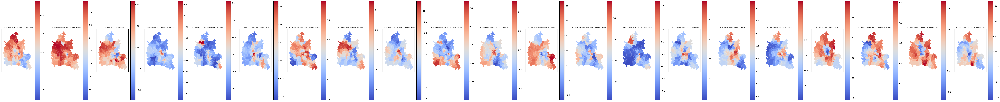

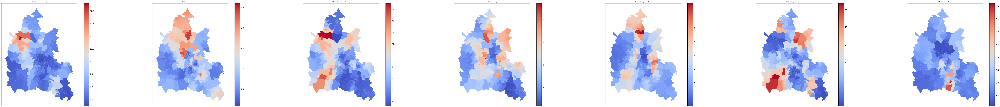

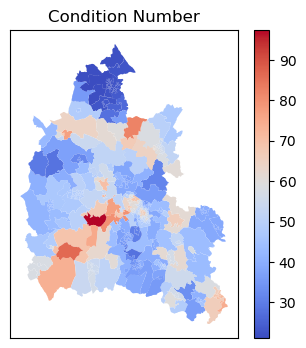

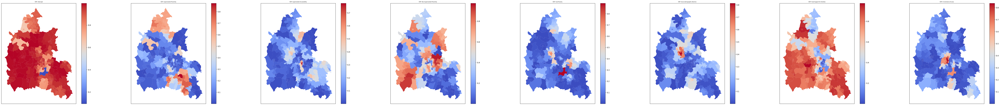

In [48]:
cols = ['Supermarket Proximity','Supermarket Accessibility','Non-Supermarket Proximity',
        'Fuel Poverty','Socio-demographic Barriers',
        'Food Support for Families','E-Commerce Access']

# define the dependent variable as the SAMHI decile
y = ppfi_Ox_Reordered_copy['Estimated Diabetes Prevalence'].values.reshape(-1,1)

# define the independent variables as the dimensions of the PPFI
X = ppfi_Ox_Reordered_copy[cols].values

y = np.array(y)
X = np.array(X)

# Define the u and v coordinates
u = points.x
v = points.y
coords = list(zip(u,v))

# Model calibration
gwr_selector = Sel_BW(coords, y, X, kernel='bisquare')
gwr_bw = gwr_selector.search()

# Fit the model
gwr_model = GWR(coords, y, X, bw=gwr_bw, kernel='bisquare')

# get the results
gwr_results = gwr_model.fit()

# capture the multicollinearity measures
LCC,VIF,CN,VDP = gwr_results.local_collinearity()

# define the list of map titles
names = [   
    'Supermarket Proximity vs Supermarket Accessibility',
    'Supermarket Proximity vs Non-Supermarket Proximity',
    'Supermarket Proximity vs Fuel Poverty',
    'Supermarket Proximity vs Socio-demographic Barriers',
    'Supermarket Proximity vs Food Support for Families',
    'Supermarket Proximity vs E-Commerce Access',
    'Supermarket Accessibility vs Non-Supermarket Proximity',
    'Supermarket Accessibility vs Fuel Poverty',
    'Supermarket Accessibility vs Socio-demographic Barriers',
    'Supermarket Accessibility vs Food Support for Families',
    'Supermarket Accessibility vs E-Commerce Access',
    'Non-Supermarket Proximity vs Fuel Poverty',
    'Non-Supermarket Proximity vs Socio-demographic Barriers',
    'Non-Supermarket Proximity vs Food Support for Families',
    'Non-Supermarket Proximity vs E-Commerce Access',
    'Fuel Poverty vs Socio-demographic Barriers',
    'Fuel Poverty vs Food Support for Families',
    'Fuel Poverty vs E-Commerce Access',
    'Socio-demographic Barriers vs Food Support for Families',
    'Socio-demographic Barriers vs E-Commerce Access',
    'Food Support for Families vs E-Commerce Access'
]

# create the maps for LCC
fig,ax = plt.subplots(1,21,figsize=(100,10))
for col in range(21):
    ppfi_Ox_Reordered_copy['lcc'] = LCC[:,col]
    ppfi_Ox_Reordered_copy.plot('lcc',ax=ax[col], legend=True, cmap='coolwarm')
    ax[col].get_xaxis().set_visible(False)
    ax[col].get_yaxis().set_visible(False)
    ax[col].set_title('LCC: ' + names[col], fontsize=6)


# define the names of the independent variables
names = ['Supermarket Proximity',
        'Supermarket Accessibility',
        'Non-Supermarket Proximity',
        'Fuel Poverty',
        'Socio-Demographic Barriers',
        'Food Support for Families',
        'E-Commerce Access']

# create the maps for VIF
fig,ax = plt.subplots(1,7,figsize=(100,10))
for col in range(7):
    ppfi_Ox_Reordered_copy['vif'] = VIF[:, col]
    ppfi_Ox_Reordered_copy.plot('vif', ax=ax[col], legend=True, cmap='coolwarm')
    ax[col].set_title('VIF: ' + names[col], fontsize=6)
    ax[col].get_xaxis().set_visible(False)
    ax[col].get_yaxis().set_visible(False)

# create the maps for CN
fig,ax = plt.subplots(1,1,figsize=(4,4))
ppfi_Ox_Reordered_copy['cn'] = CN
ppfi_Ox_Reordered_copy.plot('cn', legend=True, ax=ax, cmap='coolwarm')
ax.set_title('Condition Number')
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
names = ['Intercept',
        'Supermarket Proximity',
        'Supermarket Accessibility',
        'Non-Supermarket Proximity',
        'Fuel Poverty',
        'Socio-demographic Barriers',
        'Food Support for Families',
        'E-Commerce Access']

# create the maps for VDP
fig,ax = plt.subplots(1,8,figsize=(100,10))
for col in range(8):
    ppfi_Ox_Reordered_copy['vdp'] = VDP[:, col]
    ppfi_Ox_Reordered_copy.plot('vdp', ax=ax[col], legend=True, cmap='coolwarm')
    ax[col].get_xaxis().set_visible(False)
    ax[col].get_yaxis().set_visible(False)
    ax[col].set_title('VDP: ' + names[col], fontsize=6)

### Notes

In [49]:
ppfi_Ox_Reordered[['District','Estimated Diabetes Prevalence']].groupby('District').mean().reset_index()

,District,Estimated Diabetes Prevalence
0,Cherwell,5.625871
1,Oxford,4.193362
2,South Oxfordshire,5.154913
3,Vale of White Horse,5.303043
4,West Oxfordshire,5.377181


#### Model 1 Summary (combined decile as the independent variable)

The overall parameter summary shows that on average, every decile shift and decrease in overall food insecurity risk reduces the prevalence of T2D in Oxfordshire by 0.038%.

At the district-level, we have statistically significant coefficients in Oxford, South Oxfordshire, and Vale of White Horse. The coefficient median and mean values are negative in all three districts. The LSOA coverage is highest in Oxford. However, the contribution towards reducing the prevalence of T2D is estimated to be greatest in South Oxfordshire. Still, the coefficient magnitudes are highly similar.

Looking at the Model 2 results and the coefficients for the different dimensions, we split them to Barriers to Food Purchase (4 out of 7) and Poverty/Deprivation (3 out of 7).

#### Barriers to food purchase (Supermarket Proximity/Accessibility - Non-Supermarket Proximity - E-Commerce Access)

1) Cherwell
- In Cherwell, we see that better Non-supermarket proximity is estimated to have an adverse effect on T2D prevalence in the district and that could relate to the unhealthy nature of the low-cost and convenience foods sold at non-supermarket stores in Cherwell. As each decile shift in non-supermarket proximity is estimated to increase T2D prevalence by almost 0.5%.
- In Cherwell, we see that supermarket proximity and accessibility are estimated to have minor contributions towards T2D prevalence in the district.
- In Cherwell, we see that better access to online deliveries is estimated to have the biggest contribution towards reducing the prevalence of T2D and that could be due to the incentives and promotions on healthy products that come with online deliveries. The coefficients are also the greatest in rural towns and urban cities in comparison to rural villages which are characterized by low population densities, fewer amenities, and a more rustic feel. Besides, the significance covers a higher percentage of LSOAs classified as urban cities and rural towns than those classified as rural villages.
2) Oxford
- Similar to Cherwell, the coefficients for Supermarket Proximity and Accessibility are relatively small in magnitude. Also, the coefficient median values are both positive which might be because Oxford is a relatively small city with a reliable public transpport infrastructure. In other words, there is no need to add more supermarkets or improve the accessibility to them.
- Also, similar to Cherwell but to a less extent, better access to online deliveries is estimated to reduce the prevalence of T2D. The statistical significance also covers more than 30% of the Oxford LSOAs.
- In Oxford, enhancing non-supermarket proximity is expected to have the greatest contribution towards reducing the prevalence of T2D and it covers nearly 85% of the Oxford LSOAs.
3) South Oxfordshire
- In South Oxfordshire, both better non-supermarket proximity and access to online deliveries were estimated to increase the prevalence of T2D. 
- At the same time, we see that supermarket proximity and accessibility could contribute to reducing the prevalence of T2D. Better supermarket proximity could especially be helpful in the rural towns which have the highest LSOA coverage and magnitude. This would require adding more supermarkets.
- In terms of supermarket accessibility, we also see higher coefficient magnitudes and LSOA coverage in rural towns compared to rural villages. The significant coefficients also cover more of the rural towns than urban cities (which have slightly higher median coefficient values).
4) Vale of White Horse:
- Supermarket Accessibility is estimated to have little contribution to reducing the prevalence of T2D.
- Non-supermarket proximity is estimated to increase the prevalence of T2D - this could be due to the unhealthy and convenience foods sold at non-supermarket stores.
- Similar to non-supermarket proximity but with a lower coefficient median), supermarket proximity is estimated to have an adverse effect on the prevalence of T2D.
- E-commerce access is the only dimension under barriers to food purchase which is estimated to reduce the prevalence of T2D in Vale of White Horse. The coefficient is significant and slightly higher in the urban cities comparted to the rural villages which makes sense as more people tend to use online deliveries in the urban cities.
5) West Oxfordshire: 
- We see that non-supermarket proximity is estimated to have an adverse effect on the prevalence of T2D and particularly in the rural towns and villages (coefficients are greater in rural towns). This could be due to the unhealthy nature of foods sold at convenience stores in these rural areas.
- Supermarket proximity is estimated to have a greater contribution than supermarket accessibility towards reducing the prevalence of T2D and that particularly applies to rural areas - with rural villages having greater coefficients. Thus, having more large supermarkets in these rural areas is expected to improve access to healthy foods which reduce the risk of developing diabetes. 
- Better access to online deliveries is estimated to contribute the most to reducing the prevalence of T2D. This could reflect the propensity of people in West Oxfordshire to use online grocery delivery services thus any incentives that come with it to purchase healthy foods could contribute to reducing the prevalence of T2D. The coefficients are also greater in the rural towns compared to rural villages - since rural towns are closer to an urban city than a rural village. 


#### Poverty and Deprivation (Fuel Poverty - Socio-demographic Barriers - Food Support for Families)

1. Cherwell 
- We see that the dimensions covering poverty and deprivation all have significant and positive coefficients in Cherwell. 
- Positive and significant coefficients for socio-demographic barriers and fuel poverty could be explained by the fact that the foods which drive diabetes prevalence rates are generally cheap. In other words, even families with limited income are able to afford them in many cases.
- The positive coefficient for food support might indicate that the foods supplied through the support schemes could be unhealthy and contribute to increasing the diabetes risk. 

2. Oxford
- Similar to some extent to Cherwell, both E-commerce access and food support have positive and significant coefficients in parts of Oxford.
- However, the socio-demographic barriers dimension has negative coefficients in parts of Oxford.

3. South Oxfordshire
- We see the three dimensions are negative and significant in South Oxfordshire. 
- Both fuel poverty and socio-demographic barriers have greater coefficients in rural villages than rural towns and urban cities.
- Food support for families has greater coefficients in rural towns than in rural villages and urban cities. 

4. Vale of White Horse
- Socio-demographic barriers is the only dimension estimated to contribute to reducing the prevalence of T2D and in two urban areas.

5. West Oxfordshire
- We only see significance for food support. However, the coefficients are positive which indicates that the foods supplied in rural towns might not be the healthiest. 